# IPL Data Analysis

In [0]:
from pyspark.sql.types import *
from pyspark.sql.functions import col, when,count


In [0]:
# loading the matches dataset
matches_df=spark.read.format("csv").option("header",True).option("inferSchema",True).load("dbfs:/FileStore/tables/matches.csv")
matches_df.display()

id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,toss_decision,winner,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2
335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,field,Kolkata Knight Riders,runs,140,223,20,N,NA,Asad Rauf,RE Koertzen
335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,bat,Chennai Super Kings,runs,33,241,20,N,NA,MR Benson,SL Shastri
335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Daredevils,Rajasthan Royals,Rajasthan Royals,bat,Delhi Daredevils,wickets,9,130,20,N,NA,Aleem Dar,GA Pratapkumar
335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,Royal Challengers Bangalore,wickets,5,166,20,N,NA,SJ Davis,DJ Harper
335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Deccan Chargers,Deccan Chargers,bat,Kolkata Knight Riders,wickets,5,111,20,N,NA,BF Bowden,K Hariharan
335987,2007/08,Jaipur,2008-04-21,League,SR Watson,Sawai Mansingh Stadium,Rajasthan Royals,Kings XI Punjab,Kings XI Punjab,bat,Rajasthan Royals,wickets,6,167,20,N,NA,Aleem Dar,RB Tiffin
335988,2007/08,Hyderabad,2008-04-22,League,V Sehwag,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Delhi Daredevils,Deccan Chargers,bat,Delhi Daredevils,wickets,9,143,20,N,NA,IL Howell,AM Saheba
335989,2007/08,Chennai,2008-04-23,League,ML Hayden,"MA Chidambaram Stadium, Chepauk",Chennai Super Kings,Mumbai Indians,Mumbai Indians,field,Chennai Super Kings,runs,6,209,20,N,NA,DJ Harper,GA Pratapkumar
335990,2007/08,Hyderabad,2008-04-24,League,YK Pathan,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Rajasthan Royals,Rajasthan Royals,field,Rajasthan Royals,wickets,3,215,20,N,NA,Asad Rauf,MR Benson
335991,2007/08,Chandigarh,2008-04-25,League,KC Sangakkara,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Mumbai Indians,Mumbai Indians,field,Kings XI Punjab,runs,66,183,20,N,NA,Aleem Dar,AM Saheba


In [0]:
#loading the deliveries dataset
deliveries_df=spark.read.format("csv").option("header",True).option("inferSchema",True).load("dbfs:/FileStore/tables/deliveries.csv")
deliveries_df.display()

match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,1,SC Ganguly,P Kumar,BB McCullum,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,2,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,3,BB McCullum,P Kumar,SC Ganguly,0,1,1,wides,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,4,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,5,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,6,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,7,BB McCullum,P Kumar,SC Ganguly,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,1,BB McCullum,Z Khan,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,2,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,3,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA


In [0]:
matches_df.printSchema()
matches_df.describe()

root
 |-- id: integer (nullable = true)
 |-- season: string (nullable = true)
 |-- city: string (nullable = true)
 |-- date: date (nullable = true)
 |-- match_type: string (nullable = true)
 |-- player_of_match: string (nullable = true)
 |-- venue: string (nullable = true)
 |-- team1: string (nullable = true)
 |-- team2: string (nullable = true)
 |-- toss_winner: string (nullable = true)
 |-- toss_decision: string (nullable = true)
 |-- winner: string (nullable = true)
 |-- result: string (nullable = true)
 |-- result_margin: string (nullable = true)
 |-- target_runs: string (nullable = true)
 |-- target_overs: string (nullable = true)
 |-- super_over: string (nullable = true)
 |-- method: string (nullable = true)
 |-- umpire1: string (nullable = true)
 |-- umpire2: string (nullable = true)

Out[62]: DataFrame[summary: string, id: string, season: string, city: string, match_type: string, player_of_match: string, venue: string, team1: string, team2: string, toss_winner: string, toss_dec

In [0]:
deliveries_df.printSchema()

root
 |-- match_id: integer (nullable = true)
 |-- inning: integer (nullable = true)
 |-- batting_team: string (nullable = true)
 |-- bowling_team: string (nullable = true)
 |-- over: integer (nullable = true)
 |-- ball: integer (nullable = true)
 |-- batter: string (nullable = true)
 |-- bowler: string (nullable = true)
 |-- non_striker: string (nullable = true)
 |-- batsman_runs: integer (nullable = true)
 |-- extra_runs: integer (nullable = true)
 |-- total_runs: integer (nullable = true)
 |-- extras_type: string (nullable = true)
 |-- is_wicket: integer (nullable = true)
 |-- player_dismissed: string (nullable = true)
 |-- dismissal_kind: string (nullable = true)
 |-- fielder: string (nullable = true)



## Matches Dataset

In [0]:
#Combining team  whose names were changed 

replacement_map = {
    "Royal Challengers Bangalore": "Royal Challengers Bengaluru",
    "Delhi Daredevils": "Delhi Capitals",
    "Rising Pune Supergiant":"Rising Pune Supergiants",
    "Kings XI Punjab": "Punjab Kings"
}

# Replace multiple team names
matches_df = matches_df.replace(to_replace=replacement_map, subset=["winner"])

In [0]:
#matches
#Identify the most successful teams across all seasons
matches_df.groupBy("winner").count().orderBy(col("count").desc()).display()

winner,count
Mumbai Indians,144
Chennai Super Kings,138
Kolkata Knight Riders,131
Royal Challengers Bengaluru,123
Delhi Capitals,115
Rajasthan Royals,112
Punjab Kings,112
Sunrisers Hyderabad,88
Deccan Chargers,29
Gujarat Titans,28


**Determine the teams that have won most tosses and their win percentage after winning the toss.**

In [0]:
toss_winner_teams_df=matches_df.groupBy("toss_winner").count().alias("toss_wins")
toss_winner_teams_df.display()

toss_winner,count
Sunrisers Hyderabad,88
Lucknow Super Giants,19
Chennai Super Kings,122
Gujarat Titans,22
Royal Challengers Bengaluru,8
Rising Pune Supergiant,6
Deccan Chargers,43
Kochi Tuskers Kerala,8
Rajasthan Royals,120
Gujarat Lions,15


In [0]:
matches_after_toss_df = matches_df.withColumn(
    "Match_Won_After_Toss",
    when(col("toss_winner") == col("winner"), 1).otherwise(0))
matches_after_toss_df.display()


id,season,city,date,match_type,player_of_match,venue,team1,team2,toss_winner,toss_decision,winner,result,result_margin,target_runs,target_overs,super_over,method,umpire1,umpire2,Match_Won_After_Toss
335982,2007/08,Bangalore,2008-04-18,League,BB McCullum,M Chinnaswamy Stadium,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,field,Kolkata Knight Riders,runs,140,223,20,N,NA,Asad Rauf,RE Koertzen,0
335983,2007/08,Chandigarh,2008-04-19,League,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Chennai Super Kings,Chennai Super Kings,bat,Chennai Super Kings,runs,33,241,20,N,NA,MR Benson,SL Shastri,1
335984,2007/08,Delhi,2008-04-19,League,MF Maharoof,Feroz Shah Kotla,Delhi Daredevils,Rajasthan Royals,Rajasthan Royals,bat,Delhi Capitals,wickets,9,130,20,N,NA,Aleem Dar,GA Pratapkumar,0
335985,2007/08,Mumbai,2008-04-20,League,MV Boucher,Wankhede Stadium,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,Royal Challengers Bengaluru,wickets,5,166,20,N,NA,SJ Davis,DJ Harper,0
335986,2007/08,Kolkata,2008-04-20,League,DJ Hussey,Eden Gardens,Kolkata Knight Riders,Deccan Chargers,Deccan Chargers,bat,Kolkata Knight Riders,wickets,5,111,20,N,NA,BF Bowden,K Hariharan,0
335987,2007/08,Jaipur,2008-04-21,League,SR Watson,Sawai Mansingh Stadium,Rajasthan Royals,Kings XI Punjab,Kings XI Punjab,bat,Rajasthan Royals,wickets,6,167,20,N,NA,Aleem Dar,RB Tiffin,0
335988,2007/08,Hyderabad,2008-04-22,League,V Sehwag,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Delhi Daredevils,Deccan Chargers,bat,Delhi Capitals,wickets,9,143,20,N,NA,IL Howell,AM Saheba,0
335989,2007/08,Chennai,2008-04-23,League,ML Hayden,"MA Chidambaram Stadium, Chepauk",Chennai Super Kings,Mumbai Indians,Mumbai Indians,field,Chennai Super Kings,runs,6,209,20,N,NA,DJ Harper,GA Pratapkumar,0
335990,2007/08,Hyderabad,2008-04-24,League,YK Pathan,"Rajiv Gandhi International Stadium, Uppal",Deccan Chargers,Rajasthan Royals,Rajasthan Royals,field,Rajasthan Royals,wickets,3,215,20,N,NA,Asad Rauf,MR Benson,1
335991,2007/08,Chandigarh,2008-04-25,League,KC Sangakkara,"Punjab Cricket Association Stadium, Mohali",Kings XI Punjab,Mumbai Indians,Mumbai Indians,field,Punjab Kings,runs,66,183,20,N,NA,Aleem Dar,AM Saheba,0


In [0]:
matches_after_toss_count_df=matches_after_toss_df.groupBy("winner").agg(count(when(col("Match_Won_After_Toss")==1,1)).alias("Matches_Won_After_Toss"))
matches_after_toss_count_df.display()

winner,Matches_Won_After_Toss
Sunrisers Hyderabad,38
Lucknow Super Giants,10
Chennai Super Kings,75
Gujarat Titans,14
NA,0
Royal Challengers Bengaluru,4
Deccan Chargers,19
Kochi Tuskers Kerala,4
Rajasthan Royals,60
Gujarat Lions,10


In [0]:
toss_winners_and_match_win_df=toss_winner_teams_df.join(matches_after_toss_count_df,toss_winner_teams_df["toss_winner"]==matches_after_toss_count_df["winner"],"left").select(toss_winner_teams_df["toss_winner"].alias("Team"),"Matches_Won_After_Toss",toss_winner_teams_df["count"].alias("Toss wins"))

In [0]:
toss_winners_and_match_win_df.display()
toss_winners_and_match_win_df.printSchema()

Team,Matches_Won_After_Toss,Toss wins
Sunrisers Hyderabad,38,88
Lucknow Super Giants,10,19
Chennai Super Kings,75,122
Gujarat Titans,14,22
Royal Challengers Bengaluru,4,8
Rising Pune Supergiant,null,6
Deccan Chargers,19,43
Kochi Tuskers Kerala,4,8
Rajasthan Royals,60,120
Gujarat Lions,10,15


root
 |-- Team: string (nullable = true)
 |-- Matches_Won_After_Toss: long (nullable = true)
 |-- Toss wins: long (nullable = false)



In [0]:
toss_analysis_df = toss_winners_and_match_win_df \
    .withColumn("win_percentage_after_toss", (col("Matches_Won_After_Toss") / col("Toss wins")) * 100) \
    .orderBy(col("Toss wins").desc())
toss_analysis_df.display()

Team,Matches_Won_After_Toss,Toss wins,win_percentage_after_toss
Mumbai Indians,78,143,54.54545454545454
Chennai Super Kings,75,122,61.47540983606557
Kolkata Knight Riders,68,122,55.73770491803278
Rajasthan Royals,60,120,50.0
Royal Challengers Bangalore,null,113,null
Sunrisers Hyderabad,38,88,43.18181818181818
Kings XI Punjab,null,85,null
Delhi Daredevils,null,80,null
Delhi Capitals,26,50,52.0
Deccan Chargers,19,43,44.18604651162791


### ## Find the player of the match distribution.

In [0]:
player_of_the_match_df=matches_df.groupBy("player_of_match").count().orderBy(col("count").desc())
player_of_the_match_df.display()

player_of_match,count
AB de Villiers,25
CH Gayle,22
RG Sharma,19
DA Warner,18
V Kohli,18
MS Dhoni,17
YK Pathan,16
SR Watson,16
RA Jadeja,16
SP Narine,15


## Deliveries Dataset:

### Calculate the total runs scored by each batsman.

In [0]:
from pyspark.sql.functions import col, sum

deliveries_df = deliveries_df.withColumn("batsman_runs", col("batsman_runs").cast("integer"))

batsman_df = deliveries_df.groupBy("batter") \
    .agg(sum("batsman_runs").alias("total_runs_scored")) \
    .orderBy(col("total_runs_scored").desc())

batsman_df.display()


batter,total_runs_scored
V Kohli,8014
S Dhawan,6769
RG Sharma,6630
DA Warner,6567
SK Raina,5536
MS Dhoni,5243
AB de Villiers,5181
CH Gayle,4997
RV Uthappa,4954
KD Karthik,4843


### Identify the bowler with the highest number of wickets.

In [0]:
deliveries_df=deliveries_df.withColumn("is_wicket",col("is_wicket").cast("integer"))

In [0]:
bowler_df=deliveries_df.groupBy("bowler").agg(sum("is_wicket").alias("total_wickets")).orderBy(col("total_wickets").desc())
bowler_df.display()

bowler,total_wickets
YS Chahal,213
DJ Bravo,207
PP Chawla,201
SP Narine,200
R Ashwin,198
B Kumar,195
SL Malinga,188
A Mishra,183
JJ Bumrah,182
RA Jadeja,169


### Find the most economical bowlers (min 20 overs bowled).

In [0]:
#remove wides and no balls for legitimate deliveries
legitimate_deliveries_df = deliveries_df.filter(
    (col("extras_type").isNull()) |  # Include rows where extras_type is null
    ((col("extras_type") != "wides") & (col("extras_type") != "noballs"))  # Exclude wides and no-balls
)
legitimate_deliveries_df.display()

match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,non_striker,batsman_runs,extra_runs,total_runs,extras_type,is_wicket,player_dismissed,dismissal_kind,fielder
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,1,SC Ganguly,P Kumar,BB McCullum,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,2,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,4,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,5,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,6,BB McCullum,P Kumar,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,7,BB McCullum,P Kumar,SC Ganguly,0,1,1,legbyes,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,1,BB McCullum,Z Khan,SC Ganguly,0,0,0,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,2,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,3,BB McCullum,Z Khan,SC Ganguly,4,0,4,null,0,NA,NA,NA
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,4,BB McCullum,Z Khan,SC Ganguly,6,0,6,null,0,NA,NA,NA


In [0]:
#total_runs

total_runs_df=deliveries_df.groupBy("bowler").agg(sum("total_runs").alias("total_runs_given"))
total_runs_df.display()

bowler,total_runs_given
TM Dilshan,368
M Muralitharan,1765
LA Carseldine,6
J Botha,818
KA Pollard,2200
DR Smith,825
Jaskaran Singh,174
A Flintoff,106
GR Napier,28
B Lee,1126


In [0]:
from pyspark.sql.functions import count, col, floor


In [0]:
#total overs

total_overs_df = legitimate_deliveries_df.groupBy("bowler").agg(
    count("ball").alias("total_balls")
)
total_overs_df = total_overs_df.withColumn("no_of_overs", floor(col("total_balls") / 6))
total_overs_df=total_overs_df.filter(col("no_of_overs")>=20)

total_overs_df.display()

bowler,total_balls,no_of_overs
TM Dilshan,271,45
M Muralitharan,1528,254
J Botha,694,115
KA Pollard,1488,248
DR Smith,539,89
B Lee,875,145
Joginder Sharma,256,42
YK Pathan,1147,191
RG Sharma,339,56
SK Trivedi,1506,251


In [0]:
#economy 
economy_df = total_overs_df.join(
    total_runs_df,
    total_overs_df["bowler"] == total_runs_df["bowler"]
).select(
    total_overs_df["bowler"],
    "no_of_overs",
    "total_runs_given"
)

economy_df.display()

bowler,no_of_overs,total_runs_given
TM Dilshan,45,368
M Muralitharan,254,1765
J Botha,115,818
KA Pollard,248,2200
DR Smith,89,825
B Lee,145,1126
Joginder Sharma,42,421
YK Pathan,191,1443
RG Sharma,56,462
SK Trivedi,251,1944


In [0]:
the_economical_bowler_df=economy_df.withColumn("economy"\
    ,(col("total_runs_given")/col("no_of_overs"))).orderBy(col("economy").asc())
the_economical_bowler_df.display()

bowler,no_of_overs,total_runs_given,economy
A Chandila,39,245,6.282051282051282
SMSM Senanayake,32,211,6.59375
SM Pollock,46,307,6.673913043478261
Sohail Tanvir,41,275,6.7073170731707314
GD McGrath,54,366,6.777777777777778
IS Sodhi,30,204,6.8
A Kumble,160,1089,6.80625
SP Narine,680,4672,6.870588235294117
J Yadav,65,447,6.876923076923077
DL Vettori,129,894,6.930232558139535


## Data Integration

In [0]:
# Join deliveries_df and matches_df
integrated_df = deliveries_df.join(matches_df, deliveries_df["match_id"] == matches_df["id"], "inner")

# Select relevant columns
integrated_df = integrated_df.select(
    "match_id", "inning", "batting_team", "bowling_team", "over", "ball", "batter", "bowler", "batsman_runs",
    "is_wicket", "player_of_match", "winner", "toss_winner", "toss_decision", "venue", "season"
)

# Display a sample of the integrated data
integrated_df.display()


match_id,inning,batting_team,bowling_team,over,ball,batter,bowler,batsman_runs,is_wicket,player_of_match,winner,toss_winner,toss_decision,venue,season
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,1,SC Ganguly,P Kumar,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,2,BB McCullum,P Kumar,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,3,BB McCullum,P Kumar,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,4,BB McCullum,P Kumar,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,5,BB McCullum,P Kumar,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,6,BB McCullum,P Kumar,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,0,7,BB McCullum,P Kumar,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,1,BB McCullum,Z Khan,0,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,2,BB McCullum,Z Khan,4,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08
335982,1,Kolkata Knight Riders,Royal Challengers Bangalore,1,3,BB McCullum,Z Khan,4,0,BB McCullum,Kolkata Knight Riders,Royal Challengers Bangalore,field,M Chinnaswamy Stadium,2007/08


In [0]:
deliveries_df.printSchema()
matches_df.printSchema()

root
 |-- match_id: integer (nullable = true)
 |-- inning: integer (nullable = true)
 |-- batting_team: string (nullable = true)
 |-- bowling_team: string (nullable = true)
 |-- over: integer (nullable = true)
 |-- ball: integer (nullable = true)
 |-- batter: string (nullable = true)
 |-- bowler: string (nullable = true)
 |-- non_striker: string (nullable = true)
 |-- batsman_runs: integer (nullable = true)
 |-- extra_runs: integer (nullable = true)
 |-- total_runs: integer (nullable = true)
 |-- extras_type: string (nullable = true)
 |-- is_wicket: integer (nullable = true)
 |-- player_dismissed: string (nullable = true)
 |-- dismissal_kind: string (nullable = true)
 |-- fielder: string (nullable = true)

root
 |-- id: integer (nullable = true)
 |-- season: string (nullable = true)
 |-- city: string (nullable = true)
 |-- date: date (nullable = true)
 |-- match_type: string (nullable = true)
 |-- player_of_match: string (nullable = true)
 |-- venue: string (nullable = true)
 |-- team1

### Identify top-performing players in matches their teams won.

In [0]:
integrated_df.filter(integrated_df["winner"] == integrated_df["batting_team"]) \
             .groupBy("batter") \
             .agg({"batsman_runs": "sum"}) \
             .orderBy("sum(batsman_runs)", ascending=False) \
             .display()
              
            


batter,sum(batsman_runs)
RG Sharma,3951
S Dhawan,3732
SK Raina,3559
DA Warner,2969
MS Dhoni,2776
AT Rayudu,2676
AM Rahane,2473
SR Watson,2330
RV Uthappa,2261
Shubman Gill,2254


In [0]:
# Find the most favorable venues for specific teams
unique_matches_df = integrated_df.select("match_id", "venue", "winner").distinct()

# Group by venue and winner, then count the number of matches
venue_wins_df = unique_matches_df.groupBy("venue", "winner") \
    .count() \
    .orderBy("count", ascending=False)


venue_wins_df.display()

venue,winner,count
Eden Gardens,Kolkata Knight Riders,45
Wankhede Stadium,Mumbai Indians,42
"MA Chidambaram Stadium, Chepauk",Chennai Super Kings,33
Sawai Mansingh Stadium,Rajasthan Royals,32
M Chinnaswamy Stadium,Royal Challengers Bengaluru,29
Feroz Shah Kotla,Delhi Capitals,23
"Rajiv Gandhi International Stadium, Uppal",Sunrisers Hyderabad,20
"Punjab Cricket Association Stadium, Mohali",Punjab Kings,18
Eden Gardens,Mumbai Indians,10
Rajiv Gandhi International Stadium,Sunrisers Hyderabad,10


# Visualizations

In [0]:
matches_df.select("winner").distinct().display()

winner
Sunrisers Hyderabad
Lucknow Super Giants
Chennai Super Kings
Gujarat Titans
NA
Royal Challengers Bengaluru
Deccan Chargers
Kochi Tuskers Kerala
Rajasthan Royals
Gujarat Lions


In [0]:
changed_matches_df=matches_df
changed_matches_df.select("winner").distinct().display()


winner
Sunrisers Hyderabad
Lucknow Super Giants
Chennai Super Kings
Gujarat Titans
NA
Royal Challengers Bengaluru
Deccan Chargers
Kochi Tuskers Kerala
Rajasthan Royals
Gujarat Lions


In [0]:

season_winner_df=changed_matches_df.groupBy("winner","season").count()
season_winner_df.display()

winner,season,count
Rajasthan Royals,2013,11
Delhi Capitals,2013,3
Chennai Super Kings,2014,10
Lucknow Super Giants,2023,8
Kolkata Knight Riders,2020/21,7
Deccan Chargers,2007/08,2
Lucknow Super Giants,2024,7
Kochi Tuskers Kerala,2011,6
Rajasthan Royals,2020/21,6
Gujarat Lions,2017,4


In [0]:
pivoted_df=season_winner_df.groupBy("season").pivot("winner").sum("count")
pivoted_df=pivoted_df.fillna(0)
pivoted_df=pivoted_df.drop("NA")
pivoted_df.display()

season,Chennai Super Kings,Deccan Chargers,Delhi Capitals,Gujarat Lions,Gujarat Titans,Kochi Tuskers Kerala,Kolkata Knight Riders,Lucknow Super Giants,Mumbai Indians,Pune Warriors,Punjab Kings,Rajasthan Royals,Rising Pune Supergiants,Royal Challengers Bengaluru,Sunrisers Hyderabad
2009/10,9,8,7,0,0,0,7,0,11,0,4,6,0,8,0
2016,0,0,7,9,0,0,8,0,7,0,4,0,5,9,11
2012,10,4,11,0,0,0,12,0,10,4,8,7,0,8,0
2019,10,0,10,0,0,0,6,0,11,0,6,5,0,5,6
2017,0,0,6,4,0,0,9,0,12,0,7,0,10,3,8
2014,10,0,2,0,0,0,11,0,7,0,12,7,0,5,6
2013,12,0,3,0,0,0,6,0,13,4,8,11,0,9,10
2020/21,6,0,9,0,0,0,7,0,11,0,6,6,0,7,8
2009,8,9,10,0,0,0,3,0,5,0,7,6,0,9,0
2018,11,0,5,0,0,0,9,0,6,0,6,7,0,6,10


In [0]:
filtered_pivoted_df=pivoted_df.drop("Deccan Chargers","Gujarat Lions",\
    "Kochi Tuskers Kerala","Pune Warriors","Rising Pune Supergiants")

filtered_pivoted_pd = filtered_pivoted_df.toPandas()
filtered_pivoted_pd.set_index("season", inplace=True)

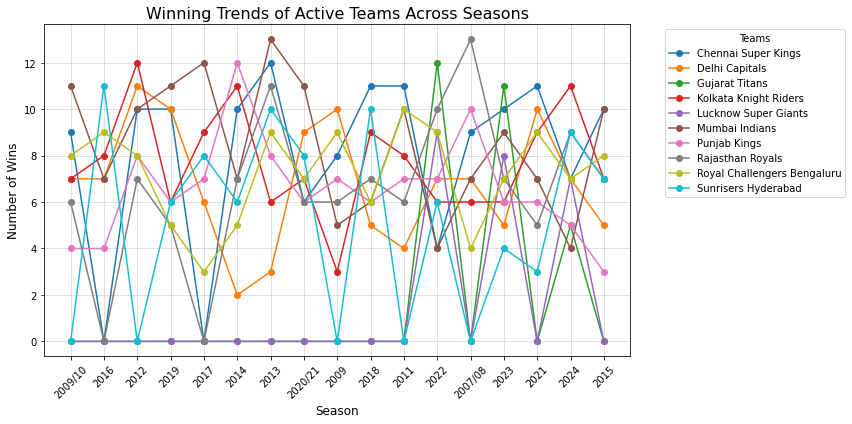

In [0]:
# Plot the filtered data
plt.figure(figsize=(12, 6))  

# Plot a line for each active team
for team in filtered_pivoted_pd.columns:
    plt.plot(filtered_pivoted_pd.index, filtered_pivoted_pd[team], label=team, marker='o')

# Adding labels, title, and legend
plt.title("Winning Trends of Active Teams Across Seasons", fontsize=16)
plt.xlabel("Season", fontsize=12)
plt.ylabel("Number of Wins", fontsize=12)
plt.xticks(filtered_pivoted_pd.index, rotation=45)  # Rotate season labels for better readability
plt.legend(title="Teams", bbox_to_anchor=(1.05, 1), loc='upper left')  # Position the legend
plt.grid(alpha=0.5)  # Add a light grid for readability

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()


top batsmen

In [0]:
top_batsmen_df=batsman_df.limit(10)
top_batsmen_df.display()

batter,total_runs_scored
V Kohli,8014
S Dhawan,6769
RG Sharma,6630
DA Warner,6567
SK Raina,5536
MS Dhoni,5243
AB de Villiers,5181
CH Gayle,4997
RV Uthappa,4954
KD Karthik,4843


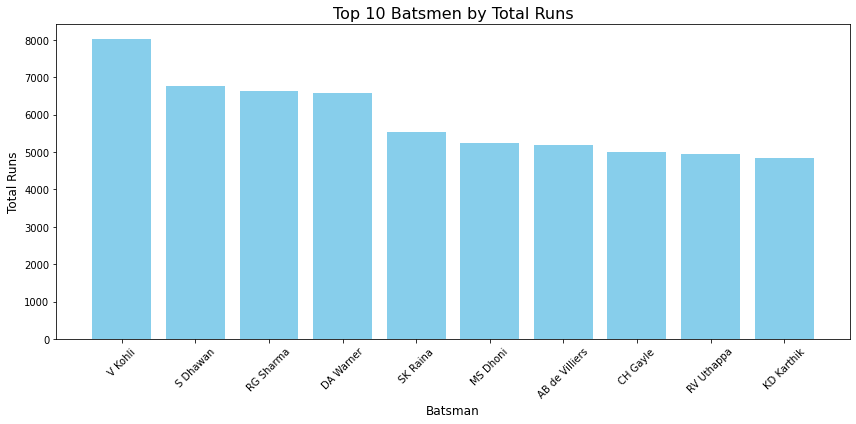

In [0]:
top_batsmen_pd = top_batsmen_df.toPandas()

# Plot the data
plt.figure(figsize=(12, 6))
plt.bar(top_batsmen_pd["batter"], top_batsmen_pd["total_runs_scored"], color='skyblue')
plt.title("Top 10 Batsmen by Total Runs", fontsize=16)
plt.xlabel("Batsman", fontsize=12)
plt.ylabel("Total Runs", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

top bowler

In [0]:
top_bowler_df=the_economical_bowler_df.limit(10)
top_bowler_df.display()

bowler,no_of_overs,total_runs_given,economy
A Chandila,39,245,6.282051282051282
SMSM Senanayake,32,211,6.59375
SM Pollock,46,307,6.673913043478261
Sohail Tanvir,41,275,6.7073170731707314
GD McGrath,54,366,6.777777777777778
IS Sodhi,30,204,6.8
A Kumble,160,1089,6.80625
SP Narine,680,4672,6.870588235294117
J Yadav,65,447,6.876923076923077
DL Vettori,129,894,6.930232558139535


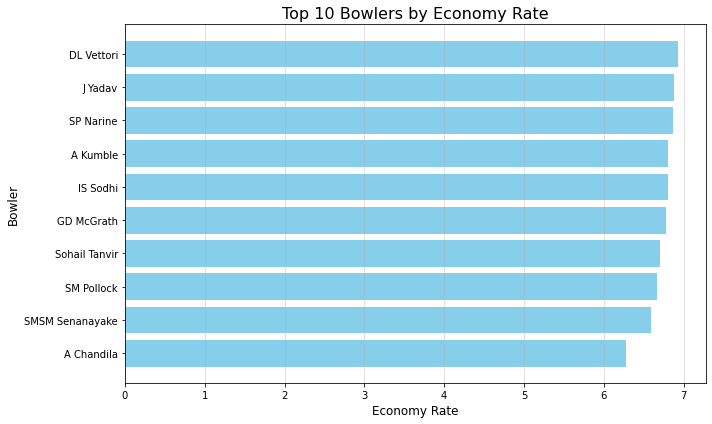

In [0]:
top_bowler_pd = top_bowler_df.toPandas()

plt.figure(figsize=(10, 6))
plt.barh(top_bowler_pd["bowler"], top_bowler_pd["economy"], color="skyblue")

# Add titles and labels
plt.title("Top 10 Bowlers by Economy Rate", fontsize=16)
plt.xlabel("Economy Rate", fontsize=12)
plt.ylabel("Bowler", fontsize=12)
plt.grid(axis="x", alpha=0.5)  # Add a light grid for readability

# Display the plot
plt.tight_layout()
plt.show()